In [1]:
! nvidia-smi

Tue Nov 15 07:01:39 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
%pip install captum timm shap grad-cam

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.4 MB 29.1 MB/s 
     |████████████████████████████████| 548 kB 68.1 MB/s 
     |████████████████████████████████| 569 kB 68.5 MB/s 
     |████████████████████████████████| 7.8 MB 28.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 163 kB 70.6 MB/s 
  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38262 sha256=09504313745fb75727c256f4c80cde724dd732ecb1e411d1c4e0b4e97be7a575
  Stored in directory: /root/.cache/pip/wheels/a4/6a/11/fa213a7aaae1a99a800b86bdd1cc95bc9c7d7914b0859663b8
Successfully built grad-cam


In [3]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

import os

from captum.attr import IntegratedGradients
from captum.attr import Saliency
from captum.attr import NoiseTunnel
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import visualization as viz

In [ ]:
device = torch.device("cuda")

In [ ]:
model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

In [ ]:
# Transformations
transform = T.Compose([
   T.Resize(224),
    #T.CenterCrop(224),
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

In [ ]:
def getImgTensor(img_path):
  img = Image.open(img_path)

  transformed_img = transform(img)

  img_tensor = transform_normalize(transformed_img)
  img_tensor = img_tensor.unsqueeze(0)

  return transformed_img, img_tensor


def getPrediction(model, img_tensor, device):
  output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]

  return pred_label_idx, predicted_label, prediction_score.squeeze().item()

In [ ]:
file_list=os.listdir("./images/")
print(file_list)
print(len(file_list))

['352518546_pizza.png', 'frog.png', '2571792092_brain_coral.png', '3145894930_dragon_fly.png', '4172104736_bullet_train.png', '3074754818_pool_table.png', '927645161_wild_mushroom.png', '4005966648_natural_dangerous_seashore.png', '561303739_war_plane.png', '3923904658_grasshopper.png']
10


Predicted: pizza ( 0.9993150234222412 )


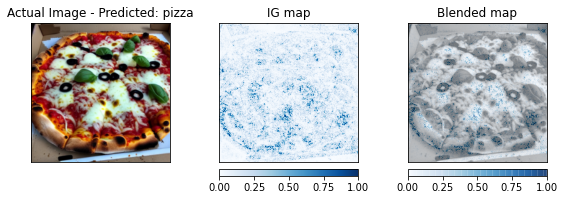

Predicted: bullfrog ( 0.5770503878593445 )


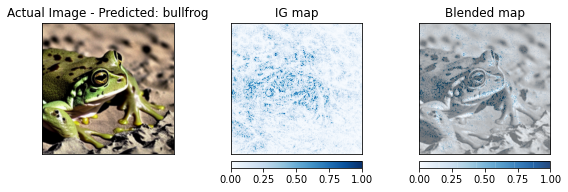

Predicted: brain coral ( 0.9903794527053833 )


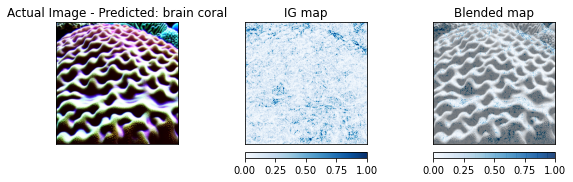

Predicted: dragonfly ( 0.9436267614364624 )


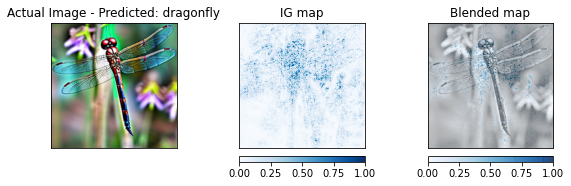

Predicted: bullet train ( 0.9957590699195862 )


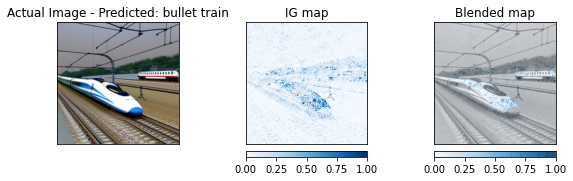

Predicted: pool table ( 0.9923056960105896 )


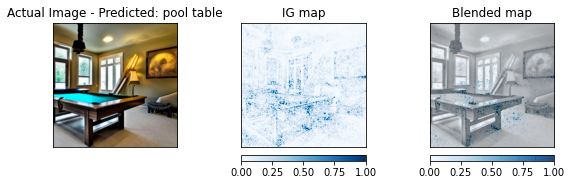

Predicted: mushroom ( 0.9715690612792969 )


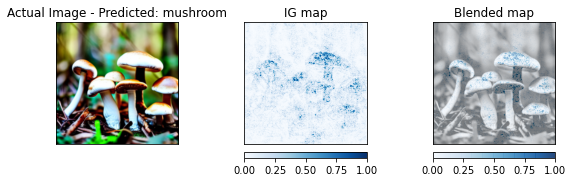

Predicted: seashore ( 0.3135817050933838 )


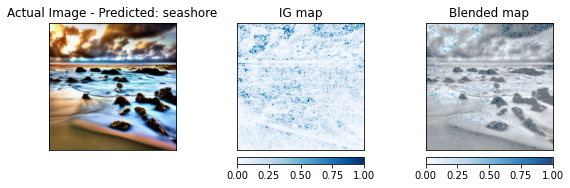

Predicted: warplane ( 0.7493204474449158 )


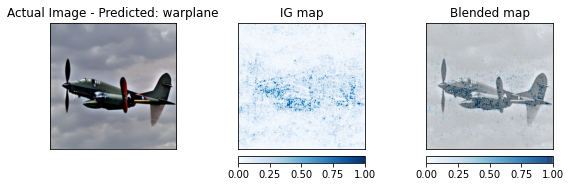

Predicted: grasshopper ( 0.41973987221717834 )


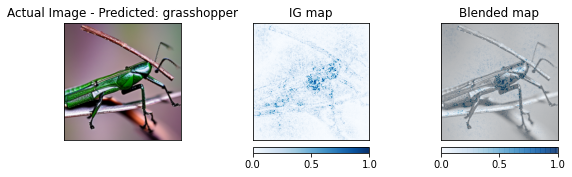

In [ ]:

for i in file_list:

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # ----- 1. Integrated Gradients -------------
  # Integrated gradients computes the integral of the gradients of the output of the model for the predicted 
  # class pred_label_idx with respect to the input image pixels along the path from the black image to our input image.
  # Compute attribution using model, image tensor, predicted target
  integrated_gradients = IntegratedGradients(model)

  attributions_ig = integrated_gradients.attribute(img_tensor, target=pred_label_idx, n_steps=200)

  title = 'Predicted: '+ predicted_label #+ ' ('+ str(prediction_score)+ ')'

  plt_fig, plt_axis = viz.visualize_image_attr_multiple(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                              np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                              methods=["original_image", "heat_map", "blended_heat_map"],
                              #cmap=default_cmap,
                              show_colorbar=True,
                              signs=["all", "absolute_value","absolute_value"],
                              outlier_perc=5,
                              titles=['Actual Image - '+title, 'IG map', 'Blended map'],
                              )

  plt_fig.savefig('./outputs/IG_Predicted: '+ predicted_label+'.png')

# IG with Noise Tunnel
smoothens them across multiple images generated by a noise tunnel. The latter adds gaussian noise with a std equals to one, 10 times (nt_samples=10) to the input. Ultimately, noise tunnel smoothens the attributions across nt_samples noisy samples using smoothgrad_sq technique. smoothgrad_sq represents the mean of the squared attributions across nt_samples samples

Predicted: pizza ( 0.9993150234222412 )


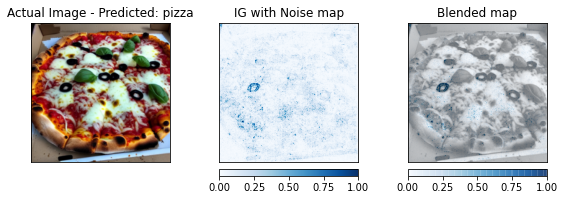

Predicted: bullfrog ( 0.5770503878593445 )


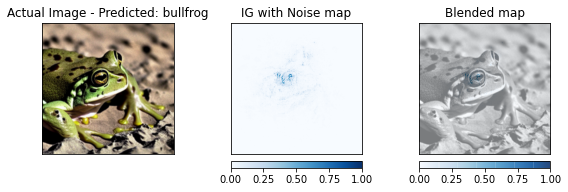

Predicted: brain coral ( 0.9903794527053833 )


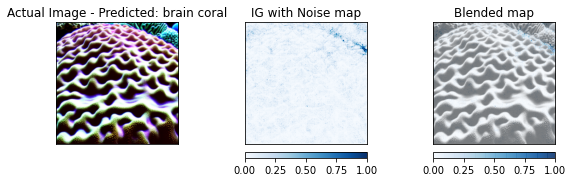

Predicted: dragonfly ( 0.9436267614364624 )


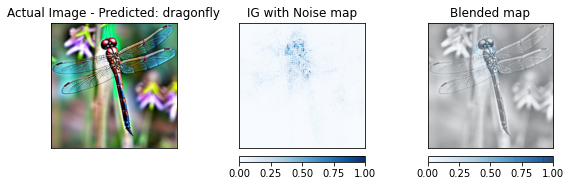

Predicted: bullet train ( 0.9957590699195862 )


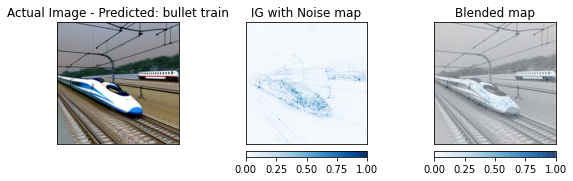

Predicted: pool table ( 0.9923056960105896 )


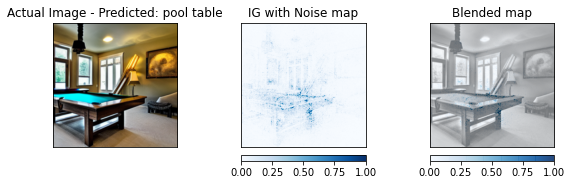

Predicted: mushroom ( 0.9715690612792969 )


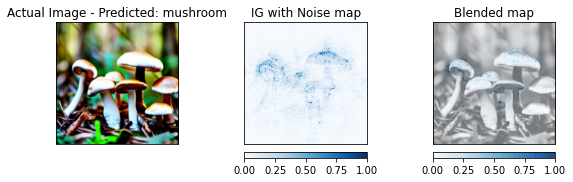

Predicted: seashore ( 0.3135817050933838 )


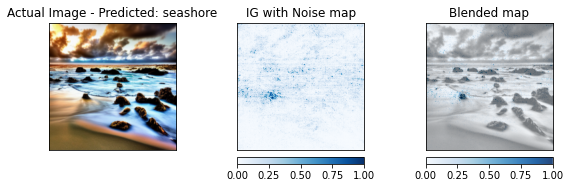

Predicted: warplane ( 0.7493204474449158 )


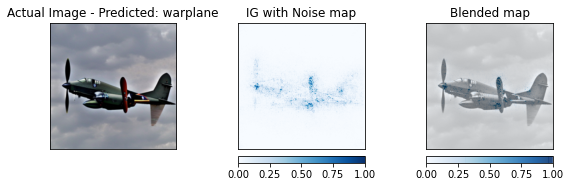

Predicted: grasshopper ( 0.41973987221717834 )


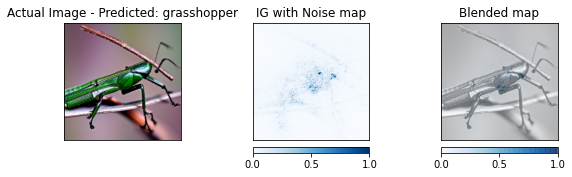

In [ ]:

for i in file_list:

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # ----- 2. Integrated Gradients with Noise Tunnel -------------
  
  noise_tunnel = NoiseTunnel(integrated_gradients)

  title = 'Predicted: '+ predicted_label #+ ' ('+ str(prediction_score)+ ')'

  attributions_ig_nt = noise_tunnel.attribute(img_tensor, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
  plt_fig, plt_axis = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        ["original_image", "heat_map", "blended_heat_map"],
                                        ["all", "absolute_value","absolute_value"],
                                        #cmap=default_cmap,
                                        titles=['Actual Image - '+title, 'IG with Noise map', 'Blended map'],
                                        show_colorbar=True)

  plt_fig.savefig('./outputs/IGnoise_Predicted: '+ predicted_label+'.png')

# SHAP

Predicted: pizza ( 0.9993150234222412 )


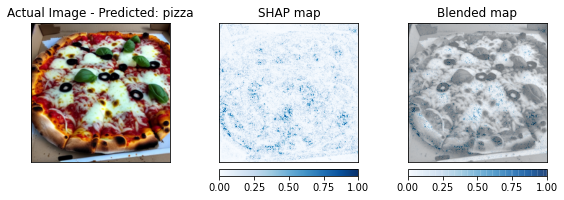

Predicted: bullfrog ( 0.5770503878593445 )


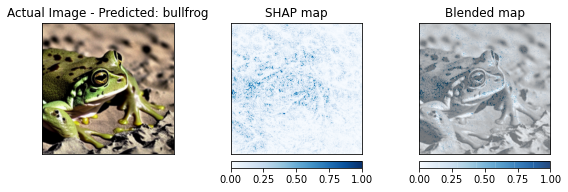

Predicted: brain coral ( 0.9903794527053833 )


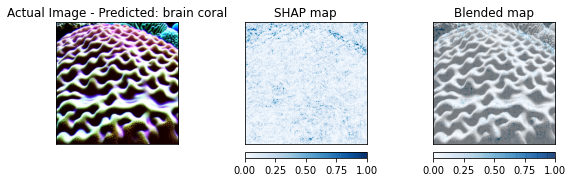

Predicted: dragonfly ( 0.9436267614364624 )


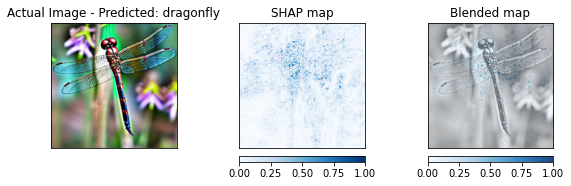

Predicted: bullet train ( 0.9957590699195862 )


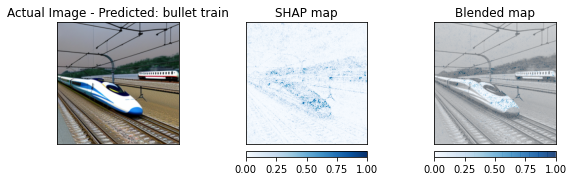

Predicted: pool table ( 0.9923056960105896 )


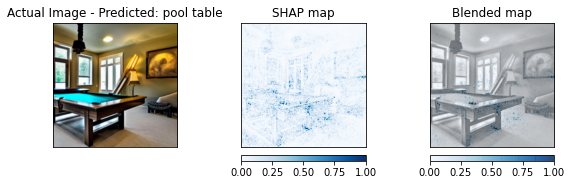

Predicted: mushroom ( 0.9715690612792969 )


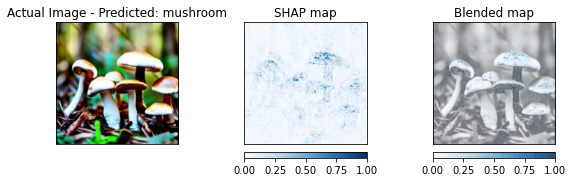

Predicted: seashore ( 0.3135817050933838 )


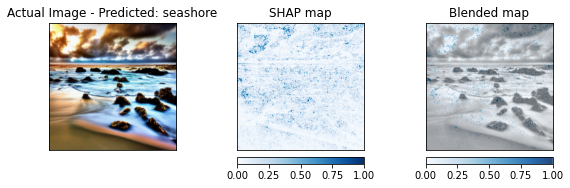

Predicted: warplane ( 0.7493204474449158 )


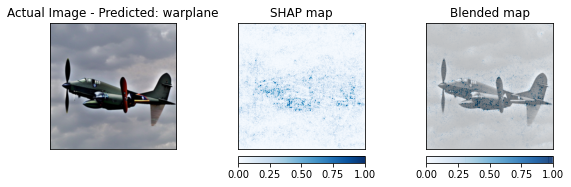

Predicted: grasshopper ( 0.41973987221717834 )


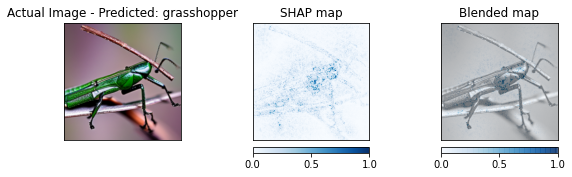

In [ ]:
torch.manual_seed(0)
np.random.seed(0)

for i in file_list:

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # ----- 3. Gradient SHAP -------------
  
  gradient_shap = GradientShap(model)

  title = 'Predicted: '+ predicted_label #+ ' ('+ str(prediction_score)+ ')'

  # Defining baseline distribution of images
  rand_img_dist = torch.cat([img_tensor * 0, img_tensor * 1])

  attributions_gs = gradient_shap.attribute(img_tensor,
                                            n_samples=50,
                                            stdevs=0.0001,
                                            baselines=rand_img_dist,
                                            target=pred_label_idx)

  plt_fig, plt_axis = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        ["original_image", "heat_map", "blended_heat_map"],
                                        ["all", "absolute_value","absolute_value"],
                                        #cmap=default_cmap,
                                        titles=['Actual Image - '+title, 'SHAP map', 'Blended map'],
                                        show_colorbar=True)

  plt_fig.savefig('./outputs/SHAP_Predicted: '+ predicted_label+'.png')

# Occlusion

Predicted: pizza ( 0.9993150234222412 )


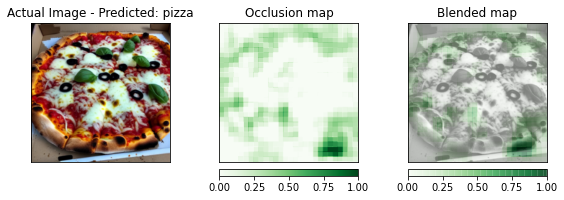

Predicted: bullfrog ( 0.5770503878593445 )


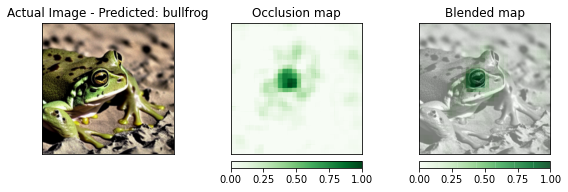

Predicted: brain coral ( 0.9903794527053833 )


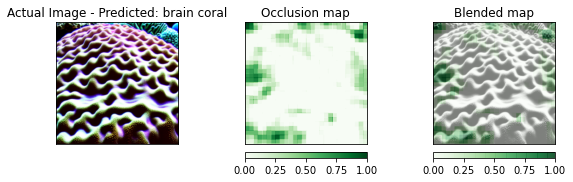

Predicted: dragonfly ( 0.9436267614364624 )


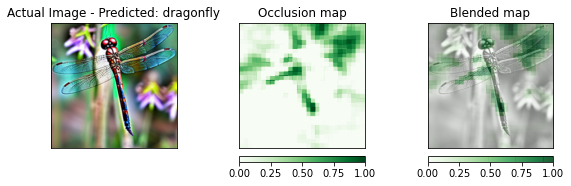

Predicted: bullet train ( 0.9957590699195862 )


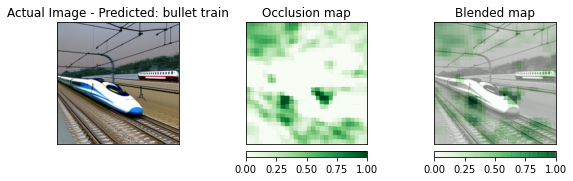

Predicted: pool table ( 0.9923056960105896 )


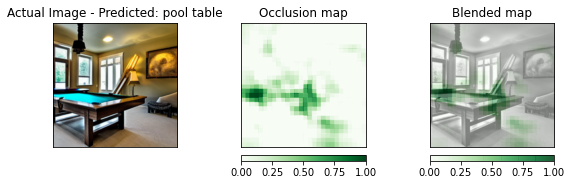

Predicted: mushroom ( 0.9715690612792969 )


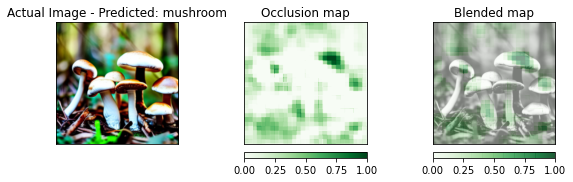

Predicted: seashore ( 0.3135817050933838 )


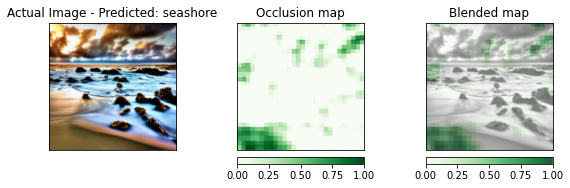

Predicted: warplane ( 0.7493204474449158 )


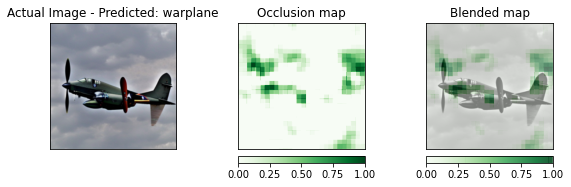

Predicted: grasshopper ( 0.41973987221717834 )


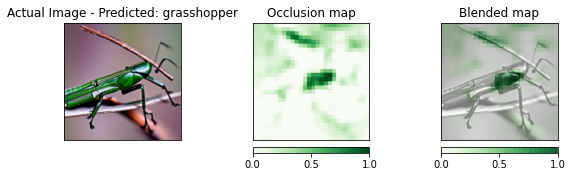

In [ ]:
for i in file_list:

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # ----- 4. Occlusion -------------
  
  occlusion = Occlusion(model)

  title = 'Predicted: '+ predicted_label #+ ' ('+ str(prediction_score)+ ')'

  # Defining baseline distribution of images
  attributions_occ = occlusion.attribute(img_tensor,
                                       strides = (3, 8, 8),
                                       target=pred_label_idx,
                                       sliding_window_shapes=(3,15, 15),
                                       baselines=0)

  plt_fig, plt_axis = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                        ["original_image", "heat_map", "blended_heat_map"],
                                        ["all", "positive","positive"],
                                        #cmap=default_cmap,
                                        titles=['Actual Image - '+title, 'Occlusion map', 'Blended map'],
                                        show_colorbar=True,
                                        outlier_perc=2) 

  plt_fig.savefig('./outputs/Occ_Predicted: '+ predicted_label+'.png')

# Grad CAM & CAM++

In [ ]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [ ]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]
inv_transform= T.Compose([
    T.Normalize(
        mean = (-1 * np.array(mean) / np.array(std)).tolist(),
        std = (1 / np.array(std)).tolist()
    ),
])

In [ ]:
target_layers = [model.layer4[-1]]

Predicted: pizza ( 0.9993150234222412 )


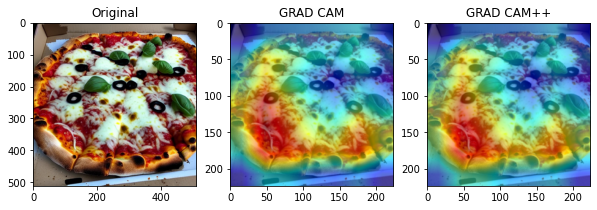

Predicted: bullfrog ( 0.5770503878593445 )


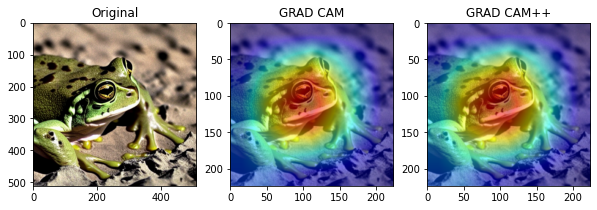

Predicted: brain coral ( 0.9903794527053833 )


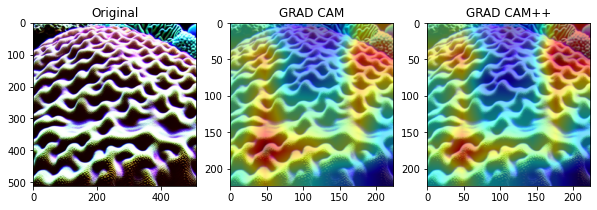

Predicted: dragonfly ( 0.9436267614364624 )


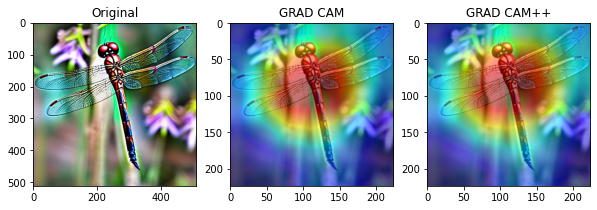

Predicted: bullet train ( 0.9957590699195862 )


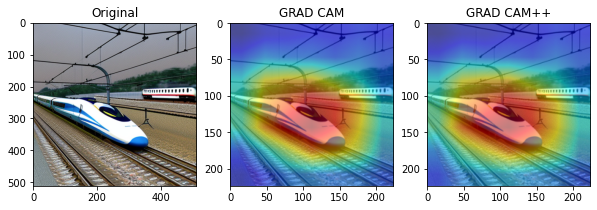

Predicted: pool table ( 0.9923056960105896 )


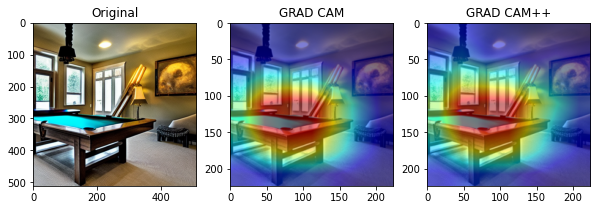

Predicted: mushroom ( 0.9715690612792969 )


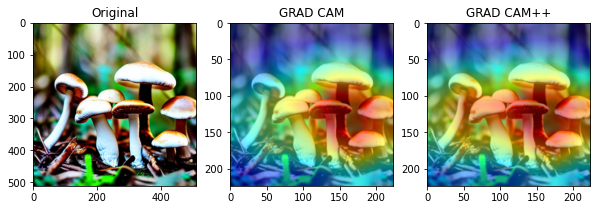

Predicted: seashore ( 0.3135817050933838 )


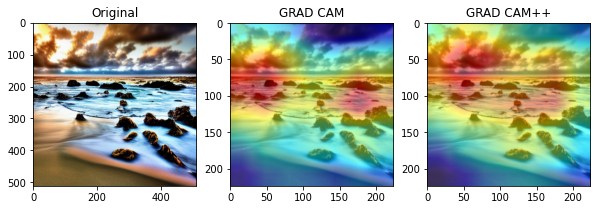

Predicted: warplane ( 0.7493204474449158 )


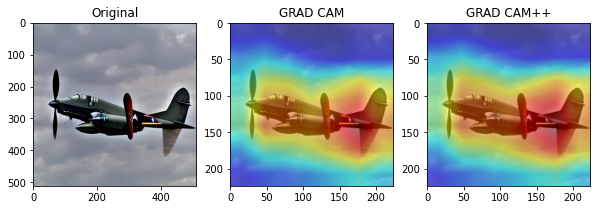

Predicted: grasshopper ( 0.41973987221717834 )


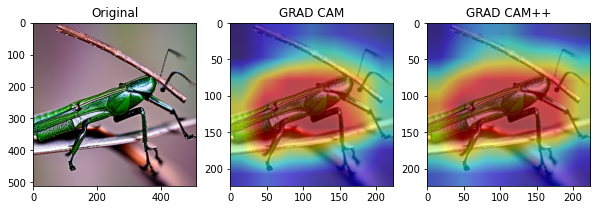

<Figure size 720x216 with 0 Axes>

In [ ]:
for i in file_list:
  img = Image.open('images/'+ i)

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)

  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # Grad CAM -------------
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)
  targets = [ClassifierOutputTarget(int(pred_label_idx.cpu()))]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=img_tensor, targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

  # Grad CAM++ -----
  camPlus = GradCAMPlusPlus(model=model, target_layers=target_layers, use_cuda=True)
  grayscale_camPlus = camPlus(input_tensor=img_tensor, targets=targets)
  
  # In this example grayscale_cam has only one image in the batch:
  grayscale_camPlus = grayscale_camPlus[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualizationPlus = show_cam_on_image(rgb_img, grayscale_camPlus, use_rgb=True)
  
  plt.rcParams["figure.figsize"] = (10,3)
  plt.subplot(1, 3, 1)
  plt.title('Original')
  plt.imshow(img)

  plt.subplot(1, 3, 2)
  plt.title('GRAD CAM')
  plt.imshow(visualization)

  plt.subplot(1, 3, 3)
  plt.title('GRAD CAM++')
  plt.imshow(visualizationPlus)
  plt.show()
  plt.savefig('./outputs/gradCAM'+i)

#plt.imshow(visualization)

# Saliency

In [4]:
%pip install captum timm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

import os

from captum.attr import IntegratedGradients
from captum.attr import Saliency
from captum.attr import NoiseTunnel
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import visualization as viz

In [ ]:
device = torch.device("cuda")

In [ ]:
model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

In [ ]:
# Transformations
transform = T.Compose([
   T.Resize(224),
    #T.CenterCrop(224),
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

In [ ]:
def getImgTensor(img_path):
  img = Image.open(img_path)

  transformed_img = transform(img)

  img_tensor = transform_normalize(transformed_img)
  img_tensor = img_tensor.unsqueeze(0)

  return transformed_img, img_tensor


def getPrediction(model, img_tensor, device):
  output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]

  return pred_label_idx, predicted_label, prediction_score.squeeze().item()

In [ ]:
file_list=os.listdir("./images/")
print(file_list)
print(len(file_list))

['3145894930_dragon_fly.png', '561303739_war_plane.png', 'frog.png', '352518546_pizza.png', '3923904658_grasshopper.png', '4172104736_bullet_train.png', '2571792092_brain_coral.png', '927645161_wild_mushroom.png', '4005966648_natural_dangerous_seashore.png', '3074754818_pool_table.png']
10


Predicted: dragonfly ( 0.9436267614364624 )


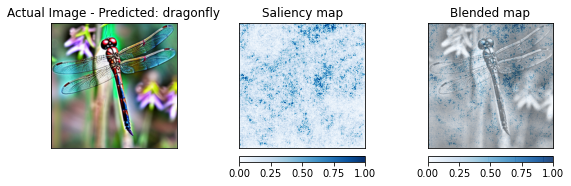

Predicted: warplane ( 0.7493204474449158 )


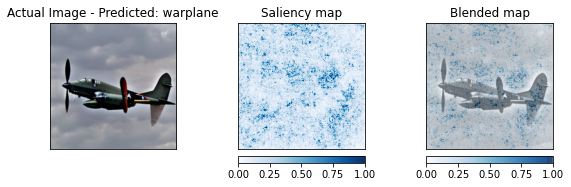

Predicted: bullfrog ( 0.5770503878593445 )


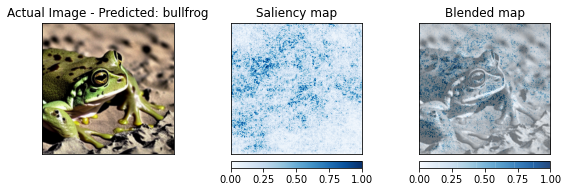

Predicted: pizza ( 0.9993150234222412 )


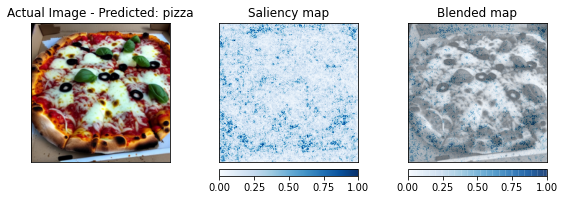

Predicted: grasshopper ( 0.41973987221717834 )


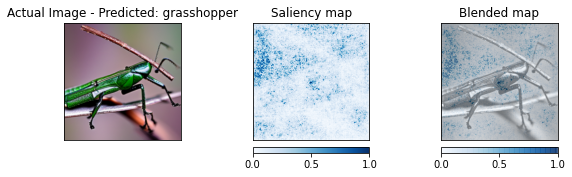

Predicted: bullet train ( 0.9957590699195862 )


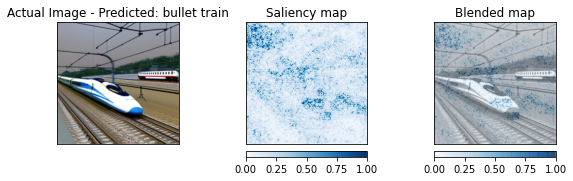

Predicted: brain coral ( 0.9903794527053833 )


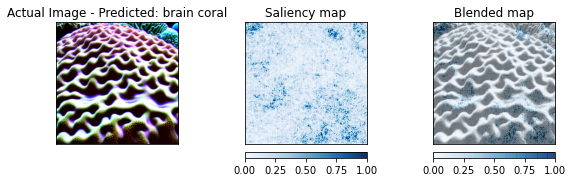

Predicted: mushroom ( 0.9715690612792969 )


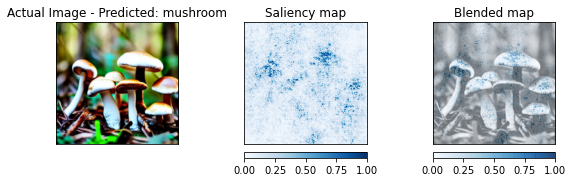

Predicted: seashore ( 0.3135817050933838 )


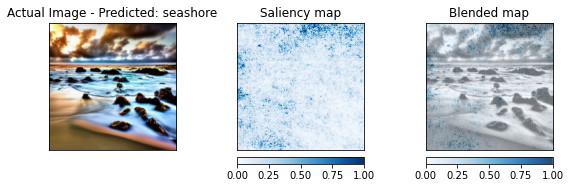

Predicted: pool table ( 0.9923056960105896 )


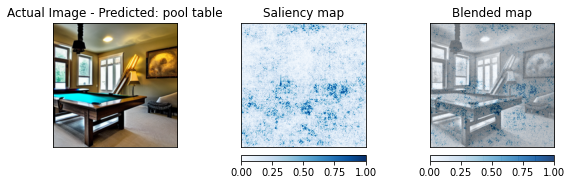

In [ ]:

for i in file_list:

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)
  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # ----- X. Saliency -------------
  
  saliency = Saliency(model)
  saliency_ig = saliency.attribute(img_tensor, target=pred_label_idx)

  #attributions_ig = integrated_gradients.attribute(img_tensor, target=pred_label_idx, n_steps=200)

  title = 'Predicted: '+ predicted_label #+ ' ('+ str(prediction_score)+ ')'

  plt_fig, plt_axis = viz.visualize_image_attr_multiple(np.transpose(saliency_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                              np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                              methods=["original_image", "heat_map", "blended_heat_map"],
                              #cmap=default_cmap,
                              show_colorbar=True,
                              signs=["all", "absolute_value","absolute_value"],
                              outlier_perc=5,
                              titles=['Actual Image - '+title, 'Saliency map', 'Blended map'],
                              )

  plt_fig.savefig('./outputs/Saliency : '+ predicted_label+'.png')

# Model Robustness

In [5]:
!pip install -U albumentations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 123 kB 32.0 MB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1


## Pixel Dropout

## Random Noise

## Random Brightness

In [ ]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

import os

from captum.attr import IntegratedGradients
from captum.attr import Saliency
from captum.attr import NoiseTunnel
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import visualization as viz

import albumentations as A

In [ ]:
device = torch.device("cuda")

model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

In [ ]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]


In [ ]:
# Transformations
transform = T.Compose([
   T.Resize(224),
    #T.CenterCrop(224),
    #T.ToTensor()
])

transformTensor = T.Compose([
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

In [ ]:
# Pixel Dropout : Set pixels to 0 with some probability.
alb_pixelDropout = A.augmentations.transforms.PixelDropout (dropout_prob=0.01, 
                                                      per_channel=False, 
                                                      drop_value=0, 
                                                      mask_drop_value=None, 
                                                      always_apply=True, 
                                                      p=1)
# Random Noise -------------
alb_randomNoise = A.augmentations.transforms.GaussNoise(var_limit=(0.0, 20), 
                                                        mean=0, 
                                                        per_channel=True, 
                                                        always_apply=True, 
                                                        p=0.5)

# Random Brightness -------------
alb_randBrightness = A.augmentations.transforms.RandomBrightness(limit=0.2, 
                                                                always_apply=True, 
                                                                p=1)

In [ ]:
def getImgTensor(img_path, alb=0):
  img = Image.open(img_path)

  transformed_img = transform(img)

  if alb==1: # Pixel Dropout
    transformed_img = alb_pixelDropout( image = np.asarray( transformed_img )) # apply alb
  elif alb==2:
    transformed_img = alb_randomNoise( image = np.asarray( transformed_img )) # apply alb
  elif alb==3:
    transformed_img = alb_randBrightness( image = np.asarray( transformed_img )) # apply alb
  else :
    pass 

  if alb in [1,2,3]:
    transformed_img = transformTensor(transformed_img['image']) # make tensor
  else :
    transformed_img = transformTensor(transformed_img) # make tensor
    
  img_tensor = transform_normalize(transformed_img)
  img_tensor = img_tensor.unsqueeze(0)

  return transformed_img, img_tensor


def getPrediction(model, img_tensor, device):
  output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]

  return pred_label_idx, predicted_label, prediction_score.squeeze().item()

In [ ]:
import os

file_list=os.listdir("./images/")
print(file_list)
print(len(file_list))

['3145894930_dragon_fly.png', '561303739_war_plane.png', 'frog.png', '352518546_pizza.png', '3923904658_grasshopper.png', '4172104736_bullet_train.png', '2571792092_brain_coral.png', '927645161_wild_mushroom.png', '4005966648_natural_dangerous_seashore.png', '3074754818_pool_table.png']
10


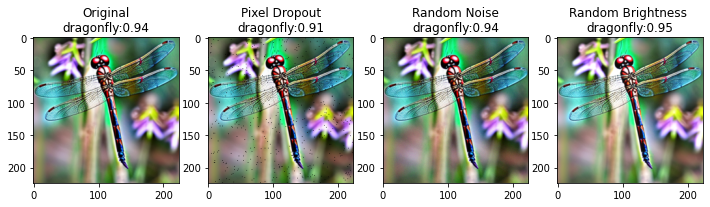

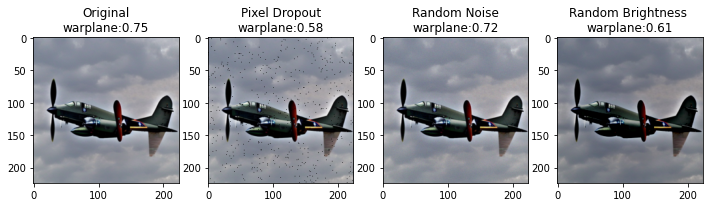

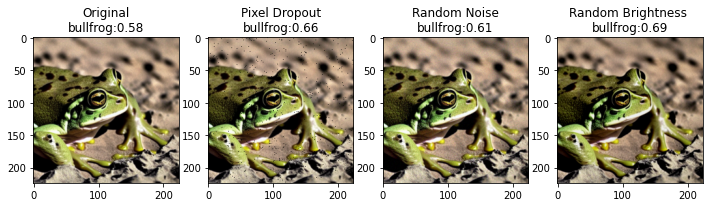

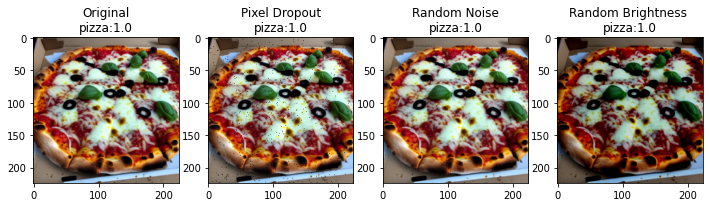

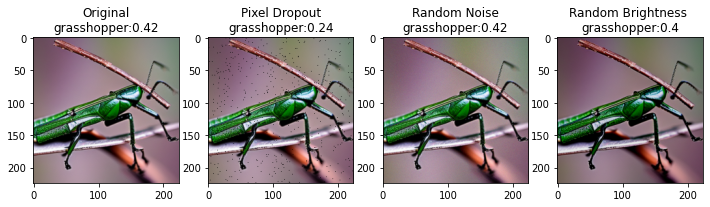

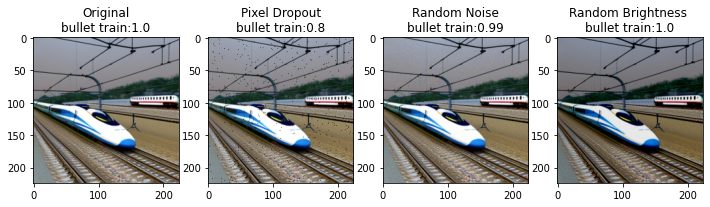

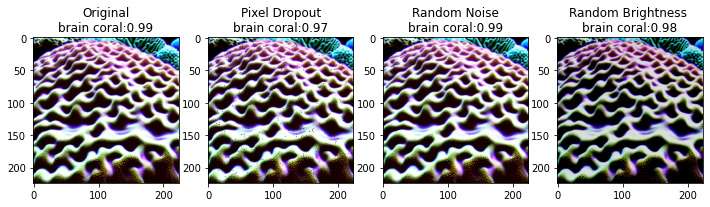

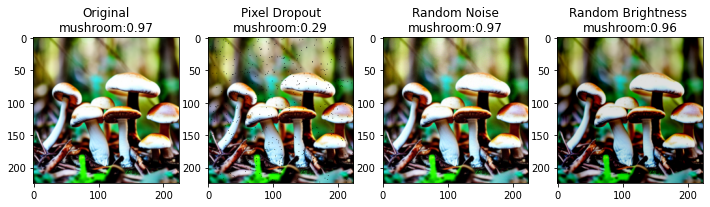

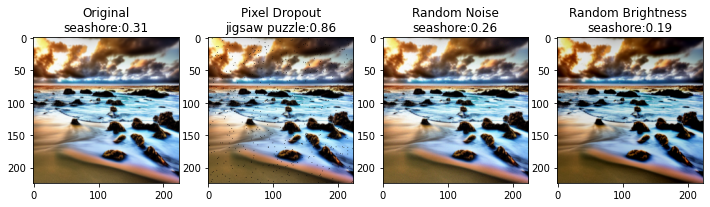

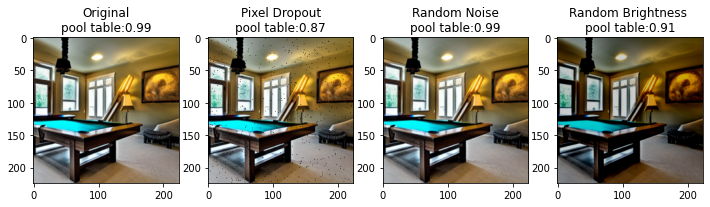

<Figure size 864x288 with 0 Axes>

In [ ]:
for i in file_list :
  # Original
  transformed_img, img_tensor = getImgTensor('images/'+ i, 0)

  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)

  plt.rcParams["figure.figsize"] = (12,4)
  plt.subplot(1, 4, 1)
  plt.title('Original\n'+ predicted_label +':'+str(np.round(prediction_score,2)))
  plt.imshow(np.transpose(transformed_img, (1,2,0)))

  # 1
  transformed_img, img_tensor = getImgTensor('images/'+ i, 1)

  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)

  plt.subplot(1, 4, 2)
  plt.title('Pixel Dropout\n'+ predicted_label +':'+str(np.round(prediction_score,2)))
  plt.imshow(np.transpose(transformed_img, (1,2,0)))


  # 2
  transformed_img, img_tensor = getImgTensor('images/'+ i, 2)

  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)

  plt.subplot(1, 4, 3)
  plt.title('Random Noise\n'+ predicted_label +':'+str(np.round(prediction_score,2)))
  plt.imshow(np.transpose(transformed_img, (1,2,0)))

  # 3
  transformed_img, img_tensor = getImgTensor('images/'+ i, 3)

  img_tensor.requires_grad = True
  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)

  plt.subplot(1, 4, 4)
  plt.title('Random Brightness \n'+ predicted_label +':'+str(np.round(prediction_score,2)))
  plt.imshow(np.transpose(transformed_img, (1,2,0)))

  plt.show()
  plt.savefig('./outputs/Robustness'+i)

## FGSM & PGD

In [6]:
import timm
import urllib
import torch

import numpy as np

import torchvision.transforms as T
import torch.nn.functional as F

from PIL import Image

#from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

import os

from captum.attr import visualization as viz

from captum.robust import FGSM
from captum.robust import PGD

In [8]:
device = torch.device("cuda")

model = timm.create_model("resnet18", pretrained=True)
model.eval()
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [9]:
# Download human-readable labels for ImageNet.
# get the classnames
url, filename = (
    "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
    "imagenet_classes.txt",
)
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

In [15]:
# Transformations
transform = T.Compose([
   T.Resize(224),
    #T.CenterCrop(224),
    T.ToTensor()
])

transform_normalize = T.Normalize(
     mean=[0.485, 0.456, 0.406],
     std=[0.229, 0.224, 0.225]
)

mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

inv_transform= T.Compose([
    T.Normalize(
        mean = (-1 * np.array(mean) / np.array(std)).tolist(),
        std = (1 / np.array(std)).tolist()
    ),
])

In [11]:
def getImgTensor(img_path):
  img = Image.open(img_path)

  transformed_img = transform(img)

  img_tensor = transform_normalize(transformed_img)
  img_tensor = img_tensor.unsqueeze(0)

  return transformed_img, img_tensor


def getPrediction(model, img_tensor, device):
  output = model(img_tensor)
  output = F.softmax(output, dim=1)
  prediction_score, pred_label_idx = torch.topk(output, 1)

  pred_label_idx.squeeze_()
  predicted_label = categories[pred_label_idx.item()]

  return pred_label_idx, predicted_label, prediction_score.squeeze().item()

In [13]:
file_list=os.listdir("./images/")
print(file_list)

['927645161_wild_mushroom.png', '3923904658_grasshopper.png', '352518546_pizza.png', '4172104736_bullet_train.png', '3145894930_dragon_fly.png', '2571792092_brain_coral.png', '4005966648_natural_dangerous_seashore.png', 'frog.png', '3074754818_pool_table.png', '561303739_war_plane.png']


In [ ]:
for i in file_list:
  img = Image.open('images/'+ i)

  # Get transformed image and tensor
  transformed_img, img_tensor = getImgTensor('images/'+ i)

  img_tensor = img_tensor.to(device)

  # Make predictions/ get predicted target
  pred_label_idx, predicted_label, prediction_score = getPrediction(model, img_tensor, device)
  print('Predicted:', predicted_label, '(', prediction_score, ')')

  # Grad CAM -------------
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)
  targets = [ClassifierOutputTarget(int(pred_label_idx.cpu()))]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=img_tensor, targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

  # Grad CAM++ -----
  camPlus = GradCAMPlusPlus(model=model, target_layers=target_layers, use_cuda=True)
  grayscale_camPlus = camPlus(input_tensor=img_tensor, targets=targets)
  
  # In this example grayscale_cam has only one image in the batch:
  grayscale_camPlus = grayscale_camPlus[0, :]
  rgb_img = inv_transform(img_tensor).cpu().squeeze().permute(1, 2, 0).detach().numpy()
  visualizationPlus = show_cam_on_image(rgb_img, grayscale_camPlus, use_rgb=True)
  
  plt.rcParams["figure.figsize"] = (10,3)
  plt.subplot(1, 3, 1)
  plt.title('Original')
  plt.imshow(img)

  plt.subplot(1, 3, 2)
  plt.title('GRAD CAM')
  plt.imshow(visualization)

  plt.subplot(1, 3, 3)
  plt.title('GRAD CAM++')
  plt.imshow(visualizationPlus)
  plt.show()
  plt.savefig('./outputs/gradCAM'+i)

#plt.imshow(visualization)

In [ ]:
!zip -r ./outputs.zip ./outputs/

  adding: outputs/ (stored 0%)
  adding: outputs/SHAP_Predicted: bullfrog.png (deflated 2%)
  adding: outputs/Occ_Predicted: pizza.png (deflated 2%)
  adding: outputs/gradCAM352518546_pizza.png (deflated 83%)
  adding: outputs/IGnoise_Predicted: bullet train.png (deflated 3%)
  adding: outputs/IGnoise_Predicted: seashore.png (deflated 2%)
  adding: outputs/gradCAM4172104736_bullet_train.png (deflated 83%)
  adding: outputs/IG_Predicted: pool table.png (deflated 2%)
  adding: outputs/SHAP_Predicted: pool table.png (deflated 2%)
  adding: outputs/SHAP_Predicted: mushroom.png (deflated 2%)
  adding: outputs/SHAP_Predicted: bullet train.png (deflated 2%)
  adding: outputs/gradCAM2571792092_brain_coral.png (deflated 83%)
  adding: outputs/IGnoise_Predicted: mushroom.png (deflated 2%)
  adding: outputs/IGnoise_Predicted: grasshopper.png (deflated 3%)
  adding: outputs/SHAP_Predicted: brain coral.png (deflated 2%)
  adding: outputs/Occ_Predicted: warplane.png (deflated 4%)
  adding: outputs/I